## Linear Regression on the winequality-red Dataset

In [119]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [120]:
df = pd.read_csv('winequality-red.csv')

In [121]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [122]:
df.head() #first five rows

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [123]:
df.describe()


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [124]:
df.isnull().any()


fixed acidity           False
volatile acidity        False
citric acid             False
residual sugar          False
chlorides               False
free sulfur dioxide     False
total sulfur dioxide    False
density                 False
pH                      False
sulphates               False
alcohol                 False
quality                 False
dtype: bool

In [125]:
print(df.dtypes)

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object


In [126]:
df = df.drop('quality', axis=1) #since it is a categorical data there is no use of this variable for model building


In [127]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [129]:
ph_column = df.pop('pH')


In [130]:
df['pH'] = ph_column

In [131]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,sulphates,alcohol,pH
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,0.56,9.4,3.51
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,0.68,9.8,3.20
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,0.65,9.8,3.26
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,0.58,9.8,3.16
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,0.56,9.4,3.51
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,0.58,10.5,3.45
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,0.76,11.2,3.52
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,0.75,11.0,3.42
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,0.71,10.2,3.57


## Exploratory Data Analysis

## Box-Plot

<Axes: >

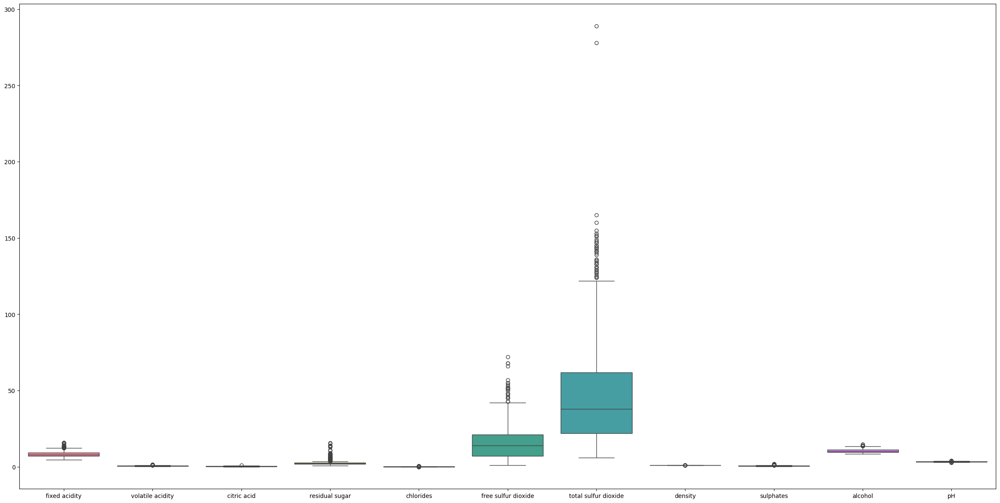

In [132]:
plt.figure(figsize=(30, 15))
sns.boxplot(data=df) 



# we can see many outliers in free sulfur dioxide, total sulfur dioxide

## Multivariate Analysis

<Figure size 3000x1500 with 0 Axes>

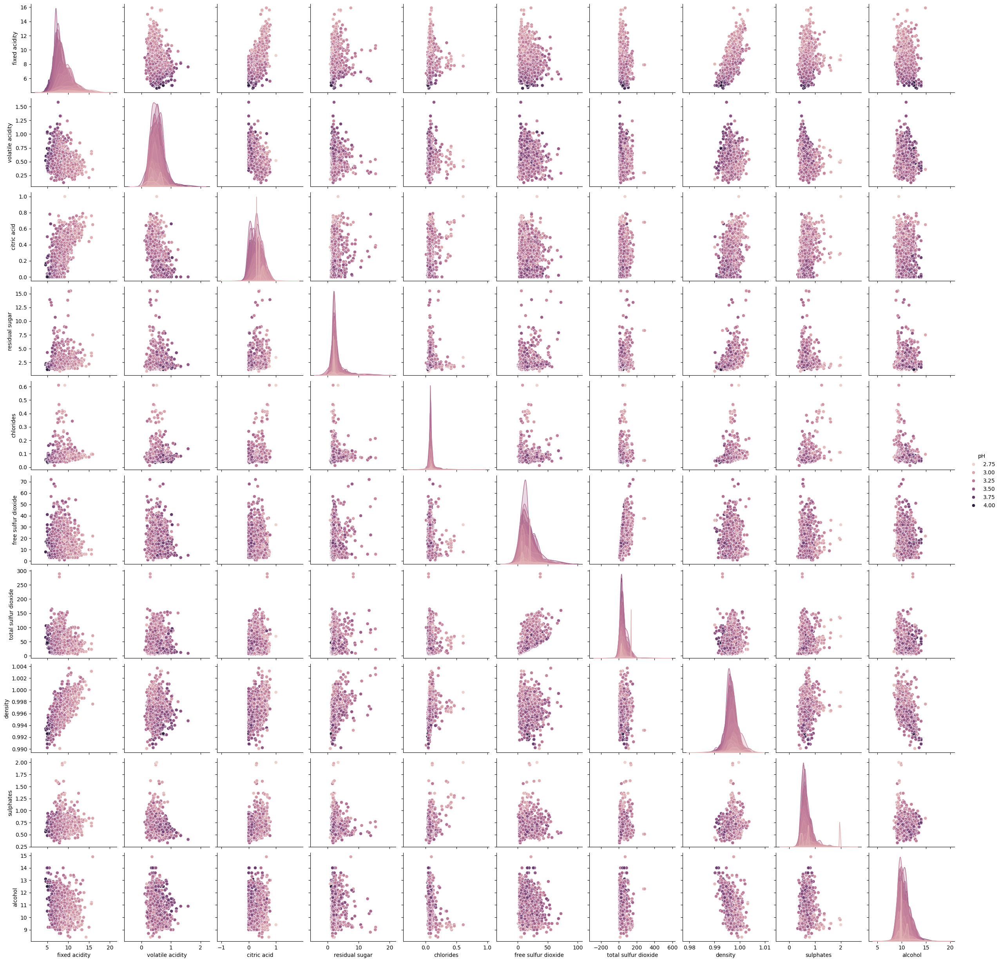

In [134]:
plt.figure(figsize=(30, 15))
sns.pairplot(data=df, hue='pH')
plt.show()

## HeatMap

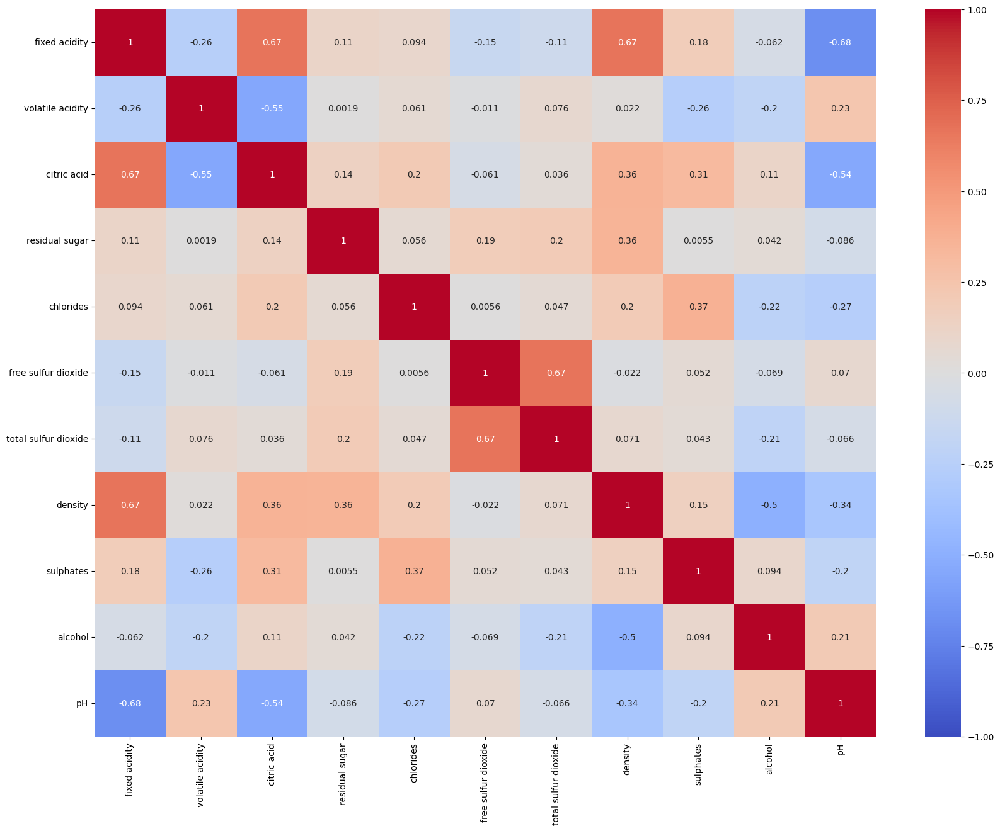

In [135]:
# Heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(df.corr(), vmin=-1, vmax=1, cmap="coolwarm", annot=True)
plt.show()

In [136]:
# From the above figure following points can be inefered
# Alcohol is having positive correlation with quality variable
# pH has a negative correlation with density, fixed acidity, citric acid, and sulfates.

C:\Users\SaiTeja\AppData\Local\Temp\ipykernel_20924\1340731355.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[col], kde=True, label='Wine-Quality Red Data')
C:\Users\SaiTeja\AppData\Local\Temp\ipykernel_20924\1340731355.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[col], kde=Tru

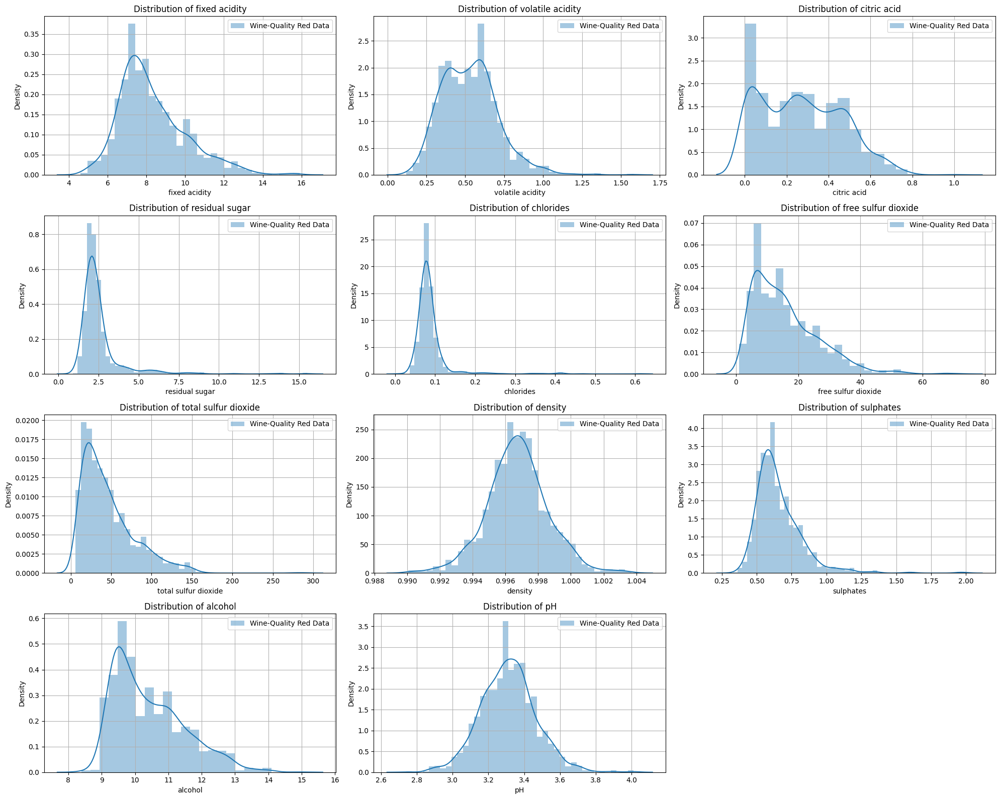

In [137]:
plt.figure(figsize=(20, 16)) 
for i, col in enumerate(list(df.columns)):
    plt.subplot(4, 3, i+1)
    sns.distplot(df[col], kde=True, label='Wine-Quality Red Data') 
    plt.grid()
    plt.legend(loc='upper right')
    plt.title(f'Distribution of {col}')

plt.tight_layout()  # Adjusted the layout
plt.show()

## From the above figure we can tell Density and Ph are Normally distributed
## From the above figure Chloride Distribution is Skewed right 

<function matplotlib.pyplot.show(close=None, block=None)>

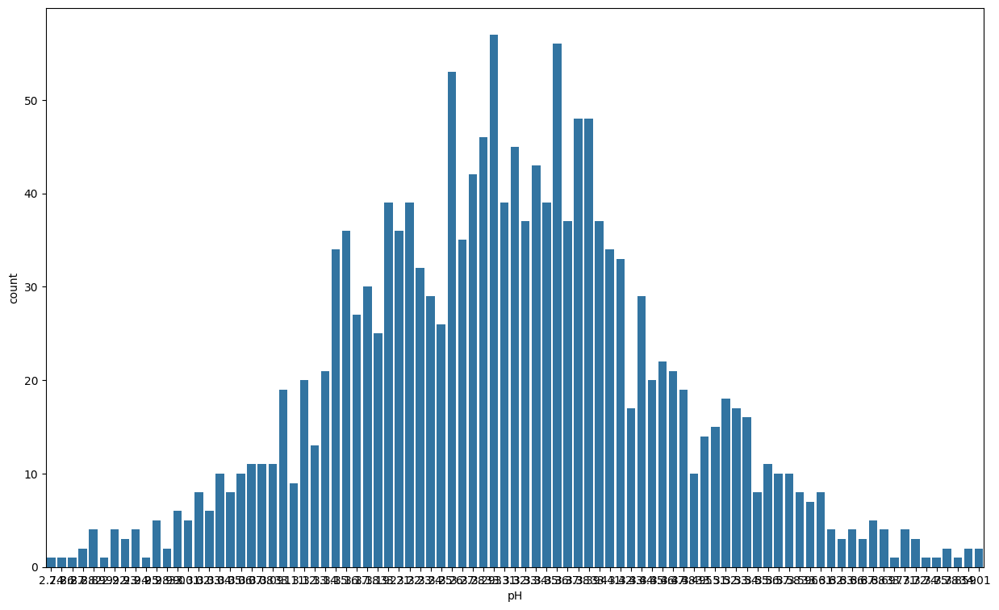

In [138]:
plt.figure(figsize=(15,9))
sns.countplot(data=df,x='pH')
plt.show

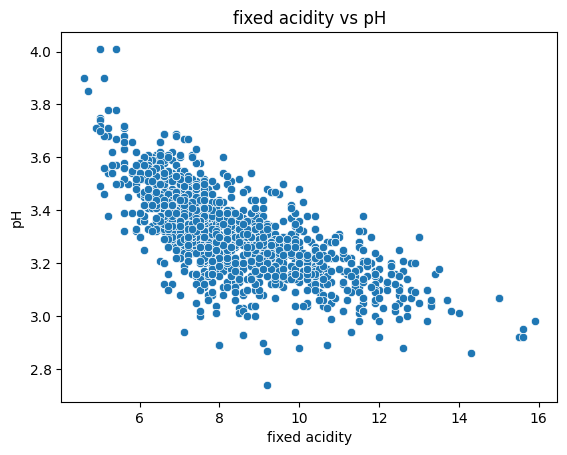

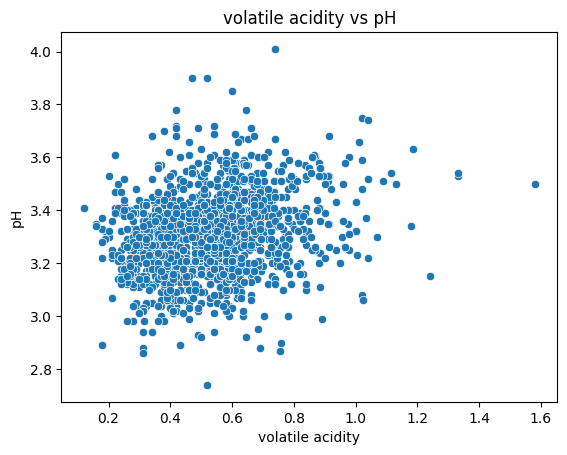

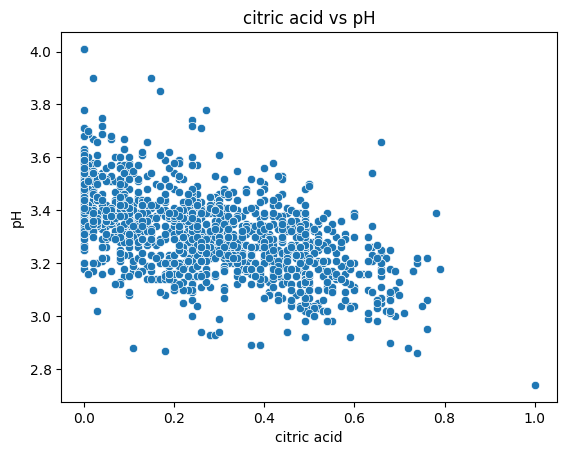

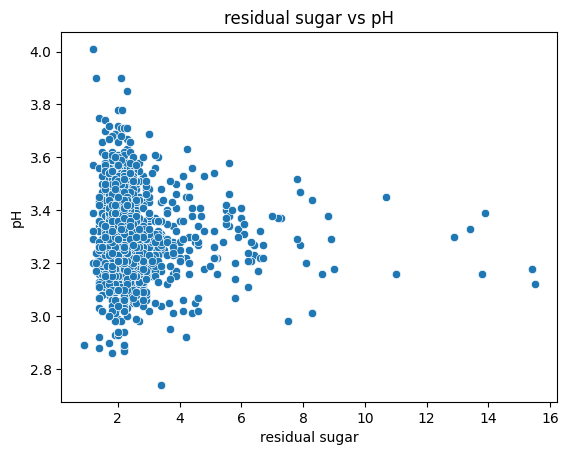

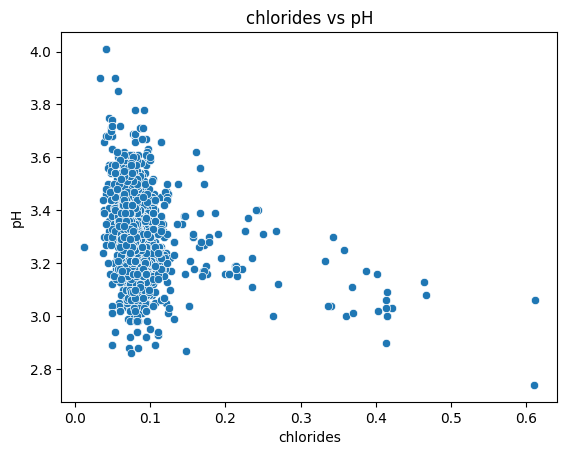

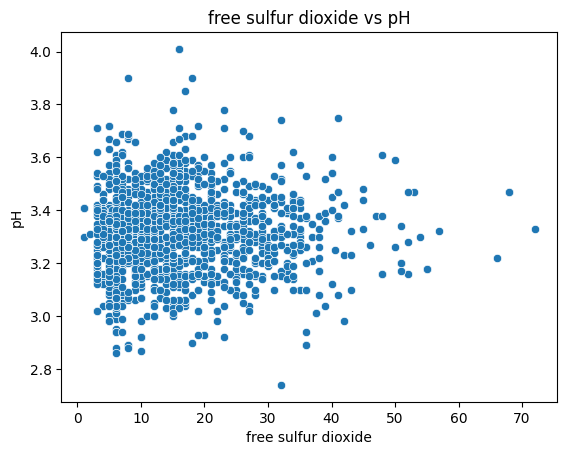

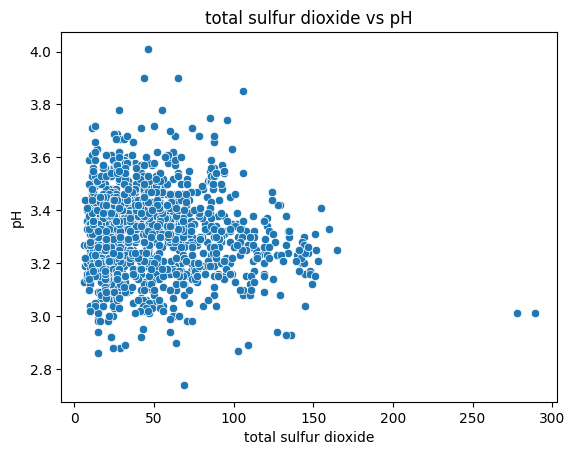

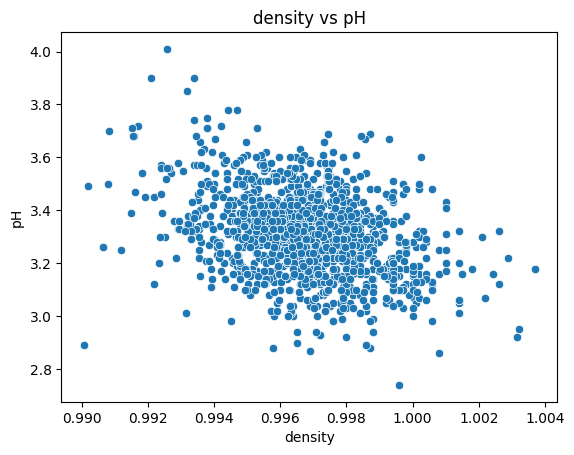

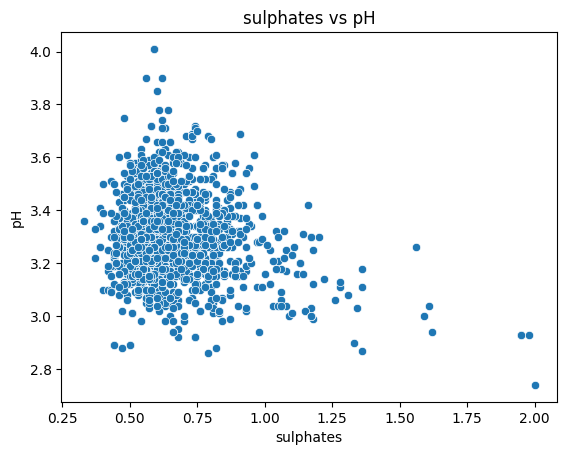

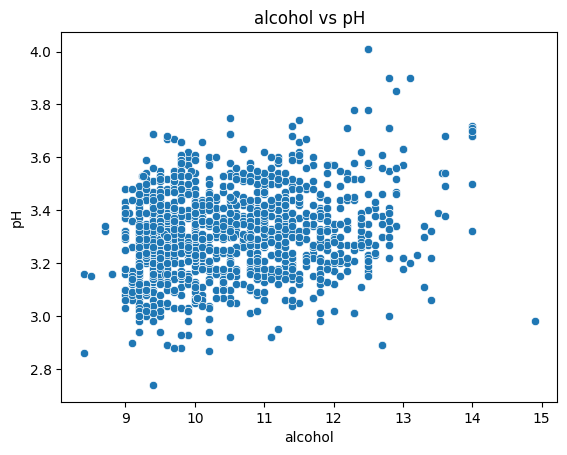

In [139]:
# Individual Scatter Plots
for feature in df.columns[:-1]:  # Exclude 'Quality'
    sns.scatterplot(x=df[feature], y=df['pH'])
    plt.title(f'{feature} vs pH')
    plt.show()

## From the above figure there might not be a clear linear relationship between the independent variable (x-axis) and the dependent variable (y-axis).

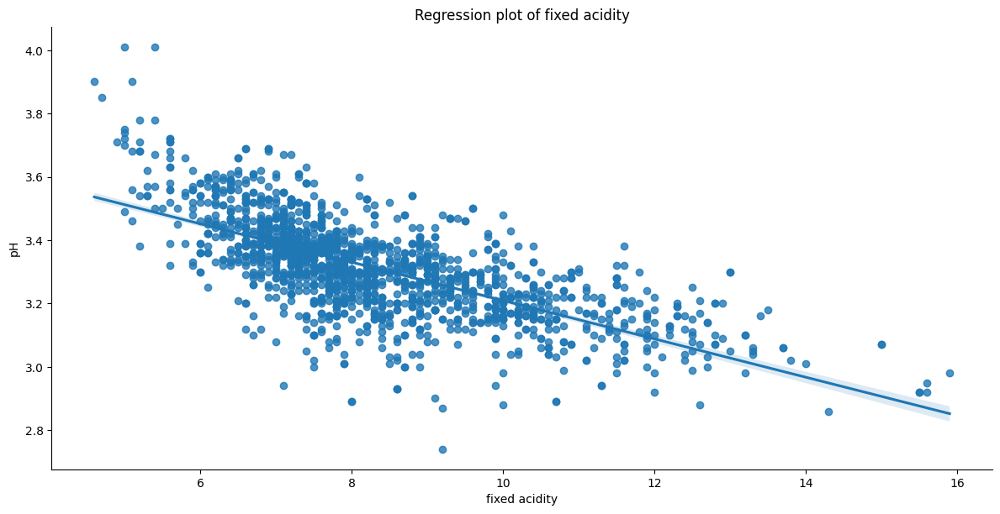

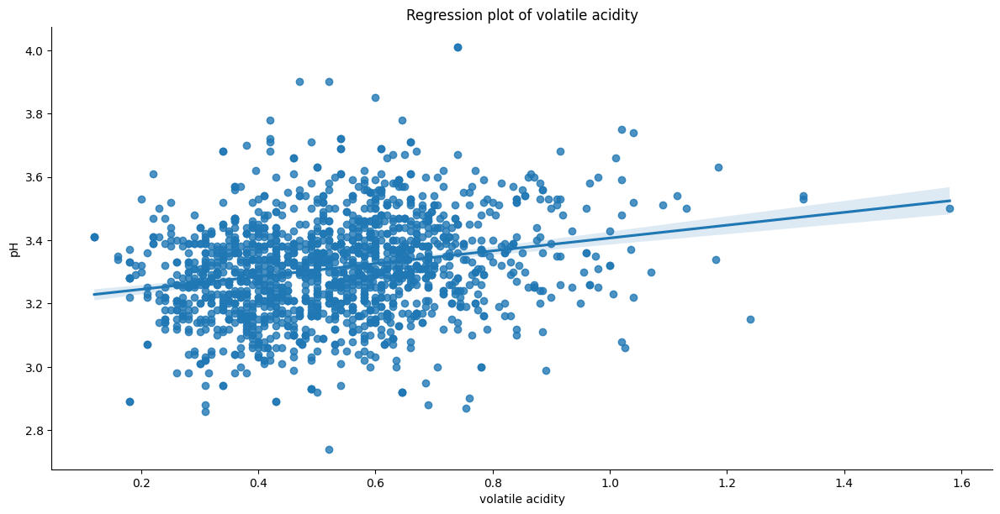

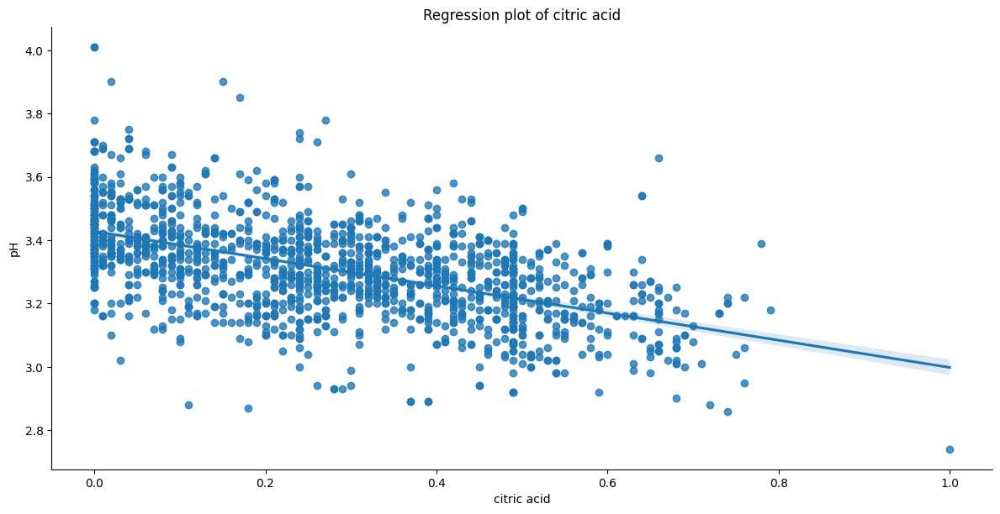

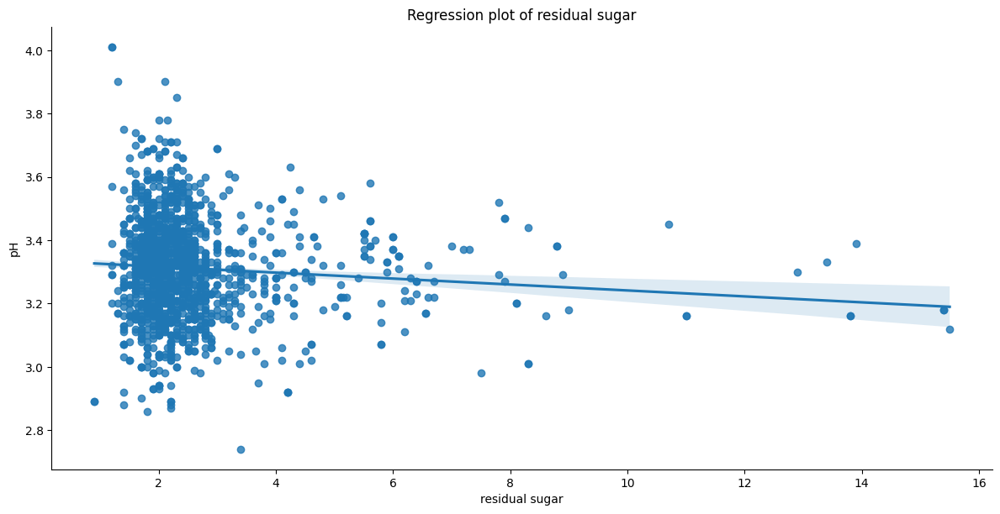

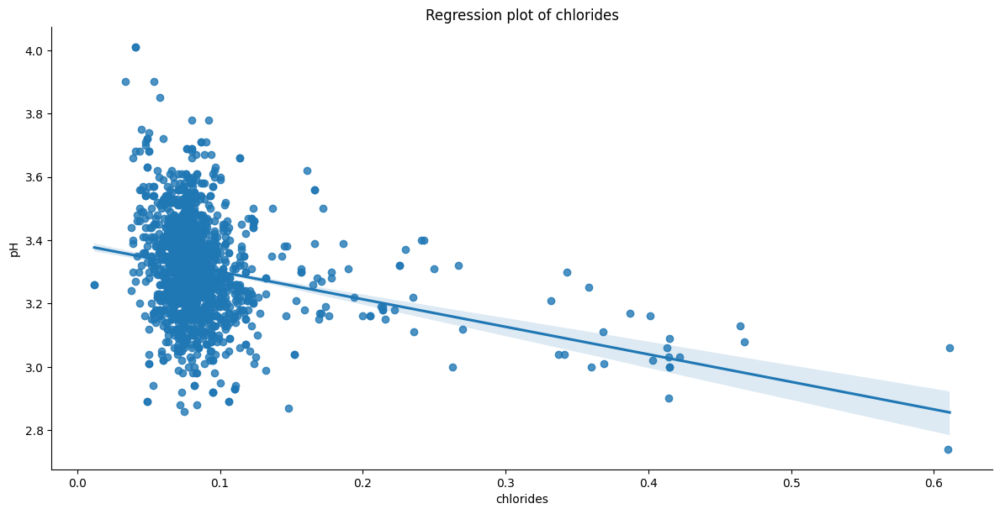

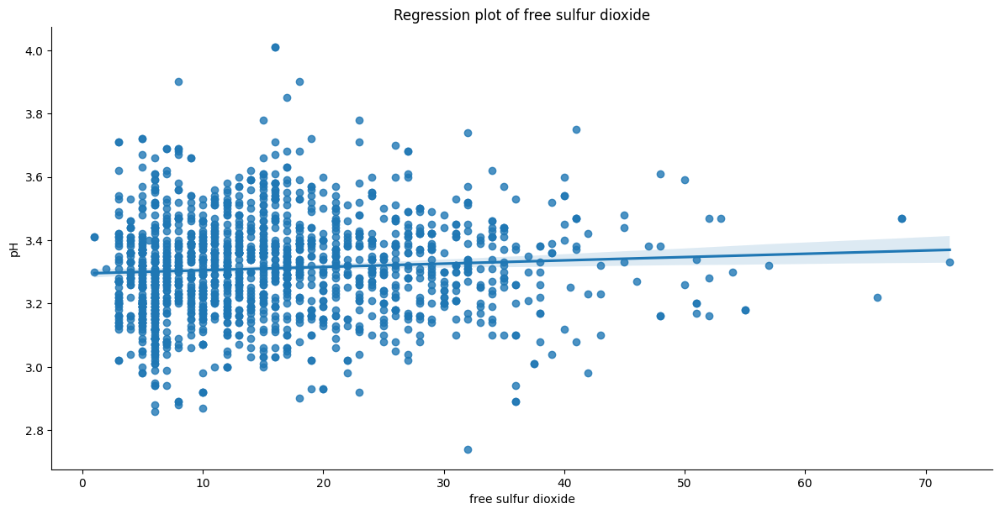

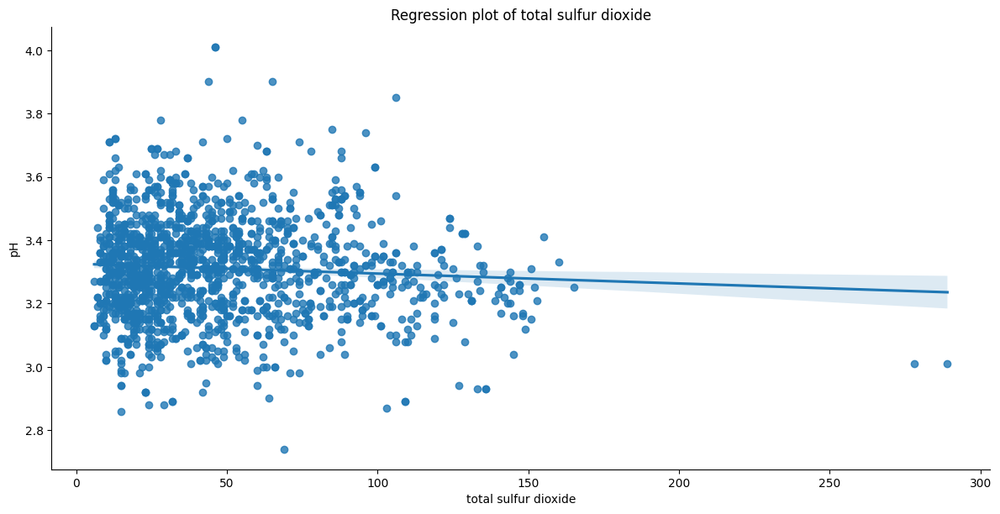

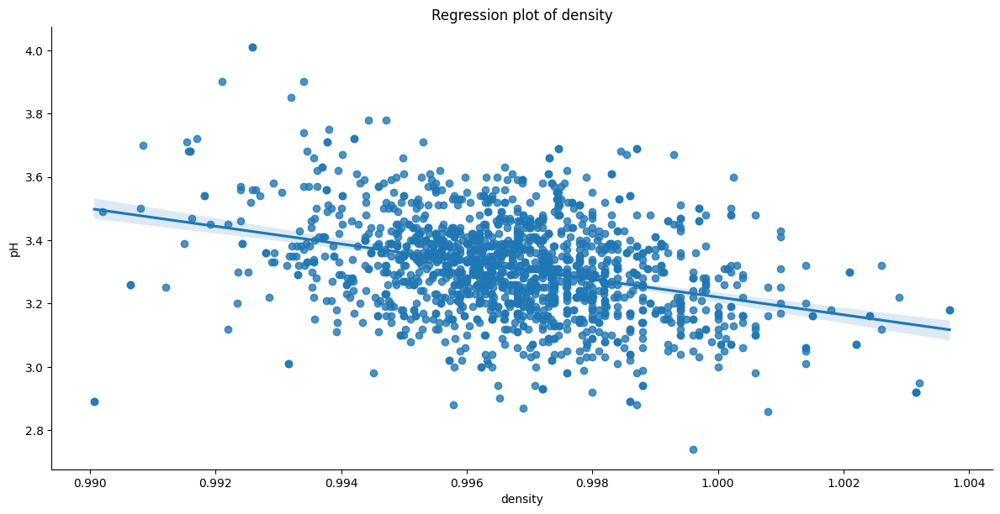

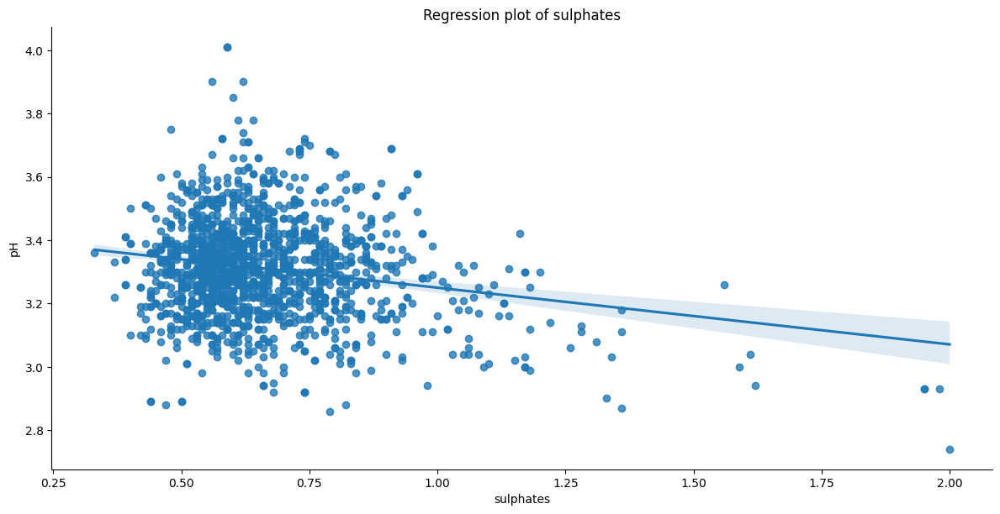

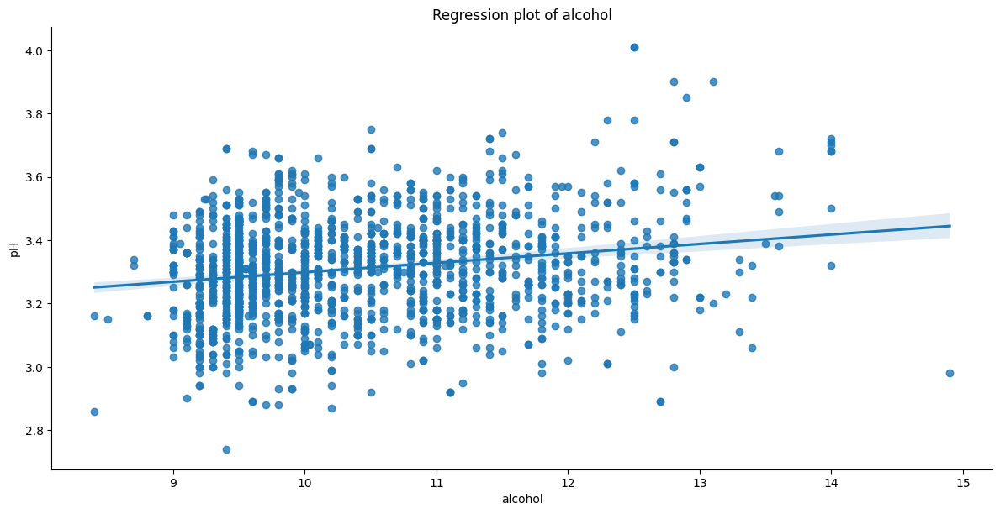

In [140]:
# Regression Line Plot
for feature in df.columns[:-1]:
    sns.lmplot(x=feature, y='pH', data=df, aspect=2, height=6)
    plt.title(f'Regression plot of {feature}')
    plt.show()

## After lot of traial and errors citric acid is showing a better linear relationship but here we are predicting the wine quality so we are assuming the 'pH' as the output variable.

## Developing the Model

In [141]:
class LinearRegression:
    def __init__(self):
        pass
    def fit(self,x,y):
        self.w = np.dot(np.linalg.inv(np.dot(x.T, x)), np.dot(x.T, y))
        return self.w
    def predict(self,x):
        return np.dot(x,self.w)
    def mean_sq_error(self,y_true,y_pred):
        N=len(y_true)
        return np.sum((y_true - y_pred) ** 2) / N
    def plot_predict(self,y_true,y_pred):
        sns.regplot(x=y_true, y=y_pred, scatter_kws={'alpha':0.5})
        plt.scatter(y_true, y_pred)
        plt.xlabel('Actual Values')
        plt.ylabel('Predictions')
        plt.title('Actual vs. Predicted')
        plt.show()

## Splitting The Data

In [142]:
split_ratio = 0.8
split_index = int(split_ratio * len(df))
train_data = df[:split_index]
test_data = df[split_index:]

In [143]:
train_data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,sulphates,alcohol,pH
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,0.56,9.4,3.51
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,0.68,9.8,3.20
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,0.65,9.8,3.26
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,0.58,9.8,3.16
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,0.56,9.4,3.51
...,...,...,...,...,...,...,...,...,...,...,...
1274,7.8,0.580,0.13,2.1,0.102,17.0,36.0,0.99440,0.53,11.2,3.24
1275,8.0,0.715,0.22,2.3,0.075,13.0,81.0,0.99688,0.54,9.5,3.24
1276,8.5,0.400,0.40,6.3,0.050,3.0,10.0,0.99566,0.56,12.0,3.28
1277,7.0,0.690,0.00,1.9,0.114,3.0,10.0,0.99636,0.60,9.7,3.35


In [144]:
print(train_data.shape)


(1279, 11)


In [145]:
test_data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,sulphates,alcohol,pH
1279,9.8,0.300,0.39,1.7,0.062,3.0,9.0,0.99480,0.57,11.5,3.14
1280,7.1,0.460,0.20,1.9,0.077,28.0,54.0,0.99560,0.64,10.4,3.37
1281,7.1,0.460,0.20,1.9,0.077,28.0,54.0,0.99560,0.64,10.4,3.37
1282,7.9,0.765,0.00,2.0,0.084,9.0,22.0,0.99619,0.68,10.9,3.33
1283,8.7,0.630,0.28,2.7,0.096,17.0,69.0,0.99734,0.63,10.2,3.26
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,0.58,10.5,3.45
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,0.76,11.2,3.52
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,0.75,11.0,3.42
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,0.71,10.2,3.57


In [146]:
print(test_data.shape)


(320, 11)


In [148]:
# Extract features and labels
X_train = train_data.drop('pH', axis=1).values
y_train = train_data['pH'].values

X_test = test_data.drop('pH', axis=1).values
y_test = test_data['pH'].values

In [149]:
print("X_train:")
print(X_train)

print("\ny_train:")
print(y_train)

print("\nX_test:")
print(X_test)

print("\ny_test:")
print(y_test)

print("\nShapes:")
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")

X_train:
[[ 7.4      0.7      0.      ...  0.9978   0.56     9.4    ]
 [ 7.8      0.88     0.      ...  0.9968   0.68     9.8    ]
 [ 7.8      0.76     0.04    ...  0.997    0.65     9.8    ]
 ...
 [ 8.5      0.4      0.4     ...  0.99566  0.56    12.     ]
 [ 7.       0.69     0.      ...  0.99636  0.6      9.7    ]
 [ 8.       0.715    0.22    ...  0.99688  0.54     9.5    ]]

y_train:
[3.51 3.2  3.26 ... 3.28 3.35 3.24]

X_test:
[[ 9.8      0.3      0.39    ...  0.9948   0.57    11.5    ]
 [ 7.1      0.46     0.2     ...  0.9956   0.64    10.4    ]
 [ 7.1      0.46     0.2     ...  0.9956   0.64    10.4    ]
 ...
 [ 6.3      0.51     0.13    ...  0.99574  0.75    11.     ]
 [ 5.9      0.645    0.12    ...  0.99547  0.71    10.2    ]
 [ 6.       0.31     0.47    ...  0.99549  0.66    11.     ]]

y_test:
[3.14 3.37 3.37 3.33 3.26 3.39 3.15 3.35 3.22 3.3  3.3  3.36 3.29 3.62
 3.34 3.29 3.2  3.2  3.35 3.45 3.5  3.78 3.6  3.3  3.36 3.12 3.3  3.29
 3.41 3.29 3.28 3.3  3.33 3.34 3.4  3.4  

In [150]:
lr=LinearRegression()

In [151]:
w = lr.fit(X_train, y_train)

In [152]:
print(w)

[-5.71088743e-02  8.17063892e-02 -3.86110936e-02 -3.99159746e-04
 -5.61350861e-01  1.88259856e-03 -8.95262295e-04  3.65038955e+00
 -2.69450961e-03  1.77469281e-02]


In [153]:
y_pred = lr.predict(X_test)

In [154]:
y_pred

array([3.24585606, 3.40194729, 3.40194729, 3.38873192, 3.27908101,
       3.41129591, 3.1354165 , 3.40015823, 3.41001031, 3.36199973,
       3.36199973, 3.39662487, 3.35985783, 3.50456428, 3.3952535 ,
       3.35985783, 3.44890225, 3.44890225, 3.43099721, 3.52803468,
       3.4423062 , 3.56342618, 3.45598398, 3.28704371, 3.32382625,
       3.34736237, 3.34486557, 3.21991441, 3.45489624, 3.21991441,
       3.39846471, 3.34486557, 3.47600878, 3.39211637, 3.3638533 ,
       3.36771666, 3.32460747, 3.56107044, 3.22947538, 3.32460747,
       3.05526226, 3.19725402, 3.58391399, 3.28845277, 3.27552262,
       3.42314234, 3.42314234, 3.42314234, 3.42314234, 3.41339722,
       3.32826725, 3.32826725, 3.35269561, 3.30050497, 3.2801559 ,
       3.37288905, 3.47981218, 3.46822897, 3.46822897, 3.46822897,
       3.37988255, 3.37988255, 3.37988255, 3.38375973, 3.37988255,
       3.15070011, 3.33171997, 3.49687877, 3.40196504, 3.40196504,
       3.43182351, 3.29289684, 3.4096053 , 3.36443392, 3.36443

In [155]:
mse=lr.mean_sq_error(y_test,y_pred)

In [156]:
print(mse)

0.009507793465166083


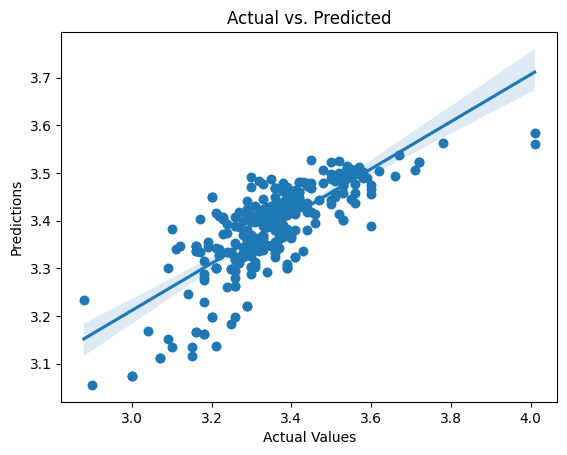

In [157]:
lr.plot_predict(y_test, y_pred)

## Logistic Regression on the penguins Dataset

In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [51]:
df=pd.read_csv('penguins.csv')

In [52]:
df

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,year
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,male,2007
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,female,2007
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,female,2007
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN,2007
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,female,2007
...,...,...,...,...,...,...,...,...
339,Chinstrap,Dream,55.8,19.8,207.0,4000.0,male,2009
340,Chinstrap,Dream,43.5,18.1,202.0,3400.0,female,2009
341,Chinstrap,Dream,49.6,18.2,193.0,3775.0,male,2009
342,Chinstrap,Dream,50.8,19.0,210.0,4100.0,male,2009


In [53]:
df = df.drop(columns=['year'])


In [54]:
df.describe()

,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g
count,342.000000,342.000000,342.000000,342.000000
mean,43.921930,17.151170,200.915205,4201.754386
std,5.459584,1.974793,14.061714,801.954536
min,32.100000,13.100000,172.000000,2700.000000
25%,39.225000,15.600000,190.000000,3550.000000
50%,44.450000,17.300000,197.000000,4050.000000
75%,48.500000,18.700000,213.000000,4750.000000
max,59.600000,21.500000,231.000000,6300.000000


In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 344 entries, 0 to 343
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   species            344 non-null    object 
 1   island             344 non-null    object 
 2   bill_length_mm     342 non-null    float64
 3   bill_depth_mm      342 non-null    float64
 4   flipper_length_mm  342 non-null    float64
 5   body_mass_g        342 non-null    float64
 6   sex                333 non-null    object 
dtypes: float64(4), object(3)
memory usage: 18.9+ KB


In [56]:
df.isnull().sum() #11Null values

species               0
island                0
bill_length_mm        2
bill_depth_mm         2
flipper_length_mm     2
body_mass_g           2
sex                  11
dtype: int64

In [57]:
# Find out each row with null values

df[df.isnull().any(axis=1)]


,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
8,Adelie,Torgersen,34.1,18.1,193.0,3475.0,NaN
9,Adelie,Torgersen,42.0,20.2,190.0,4250.0,NaN
10,Adelie,Torgersen,37.8,17.1,186.0,3300.0,NaN
11,Adelie,Torgersen,37.8,17.3,180.0,3700.0,NaN
47,Adelie,Dream,37.5,18.9,179.0,2975.0,NaN
178,Gentoo,Biscoe,44.5,14.3,216.0,4100.0,NaN
218,Gentoo,Biscoe,46.2,14.4,214.0,4650.0,NaN
256,Gentoo,Biscoe,47.3,13.8,216.0,4725.0,NaN
268,Gentoo,Biscoe,44.5,15.7,217.0,4875.0,NaN


In [58]:
# Dropping the 2 rows with null values for all variables

df.drop(df[df['body_mass_g'].isnull()].index,axis=0, inplace=True)

In [59]:
df[df.isnull().any(axis=1)]


,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
8,Adelie,Torgersen,34.1,18.1,193.0,3475.0,NaN
9,Adelie,Torgersen,42.0,20.2,190.0,4250.0,NaN
10,Adelie,Torgersen,37.8,17.1,186.0,3300.0,NaN
11,Adelie,Torgersen,37.8,17.3,180.0,3700.0,NaN
47,Adelie,Dream,37.5,18.9,179.0,2975.0,NaN
178,Gentoo,Biscoe,44.5,14.3,216.0,4100.0,NaN
218,Gentoo,Biscoe,46.2,14.4,214.0,4650.0,NaN
256,Gentoo,Biscoe,47.3,13.8,216.0,4725.0,NaN
268,Gentoo,Biscoe,44.5,15.7,217.0,4875.0,NaN


In [60]:
sex_mode = df['sex'].mode()[0]

print(f"The mode of the 'sex' variable is: {sex_mode}")

The mode of the 'sex' variable is: male


In [61]:
#imputing the null values in sex with its mode
#you can impute missing values in the 'sex' variable with its mode. This is a common practice when dealing with categorical variables with missing data.

df['sex'] = df['sex'].fillna('male') 

In [62]:
df

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,female
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,female
5,Adelie,Torgersen,39.3,20.6,190.0,3650.0,male
...,...,...,...,...,...,...,...
339,Chinstrap,Dream,55.8,19.8,207.0,4000.0,male
340,Chinstrap,Dream,43.5,18.1,202.0,3400.0,female
341,Chinstrap,Dream,49.6,18.2,193.0,3775.0,male
342,Chinstrap,Dream,50.8,19.0,210.0,4100.0,male


In [63]:
print("Rows with Missing Values:")
print(df[df.isnull().any(axis=1)])

Rows with Missing Values:
Empty DataFrame
Columns: [species, island, bill_length_mm, bill_depth_mm, flipper_length_mm, body_mass_g, sex]
Index: []


In [64]:
df.isnull().sum() #checking null values

species              0
island               0
bill_length_mm       0
bill_depth_mm        0
flipper_length_mm    0
body_mass_g          0
sex                  0
dtype: int64

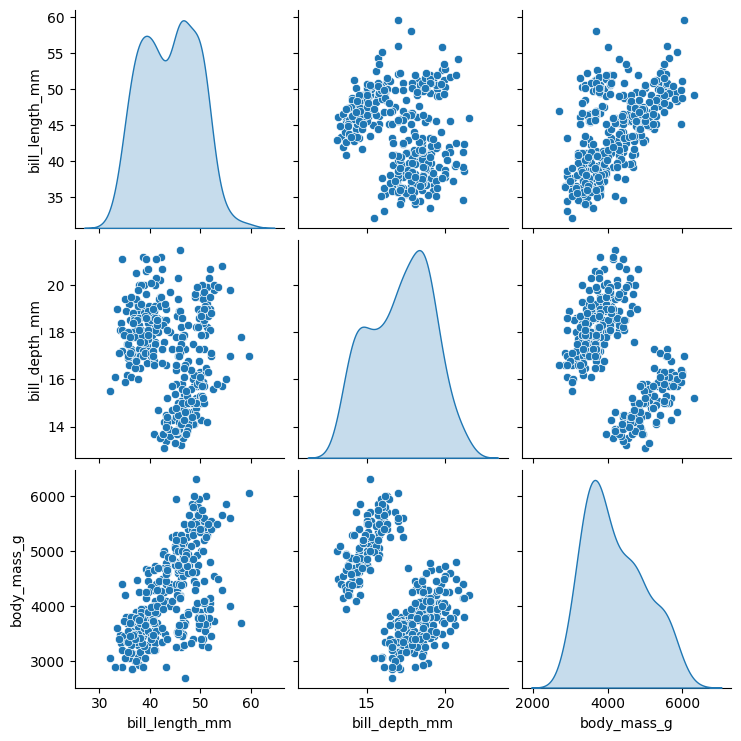

In [65]:
sns.pairplot(df[['bill_length_mm', 'bill_depth_mm', 'body_mass_g']], diag_kind='kde')
plt.show()

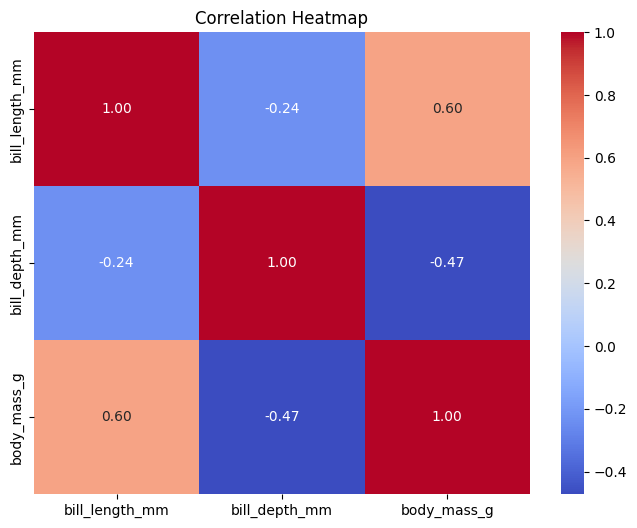

In [66]:
# correlation heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(df[['bill_length_mm', 'bill_depth_mm', 'body_mass_g']].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

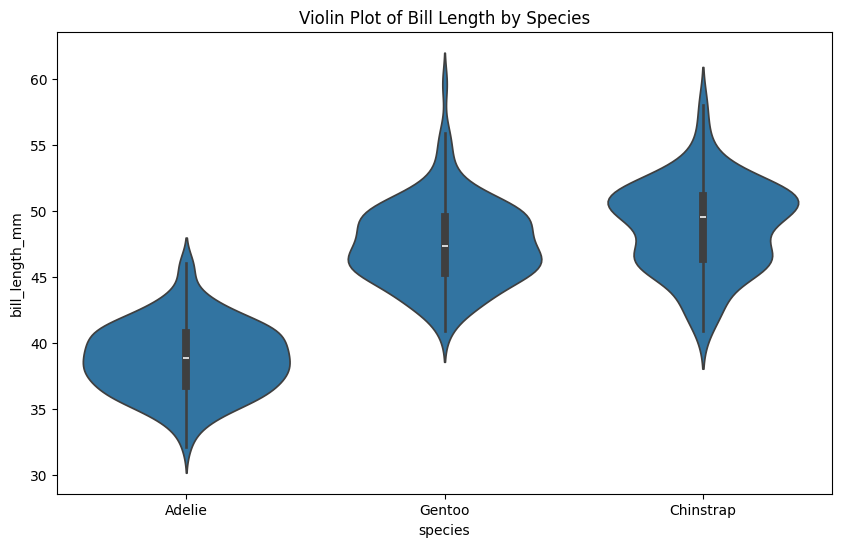

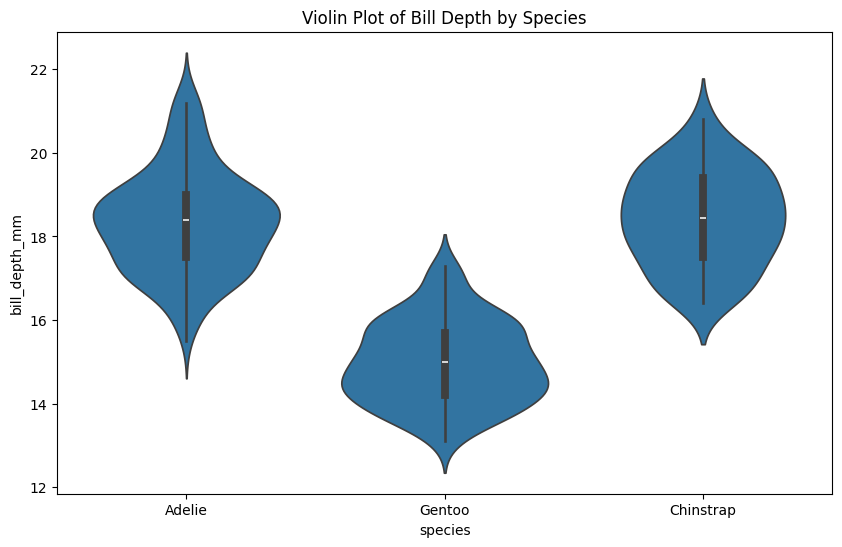

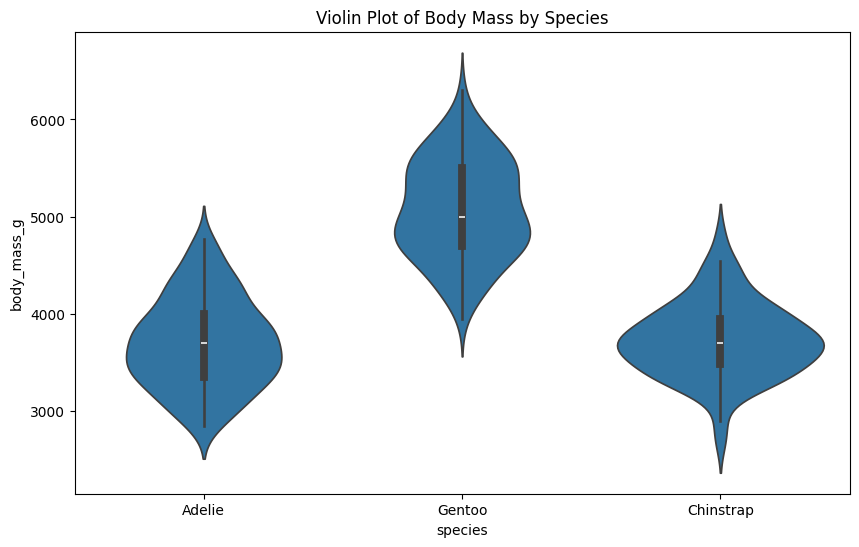

In [67]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='species', y='bill_length_mm', data=df)
plt.title('Violin Plot of Bill Length by Species')
plt.show()

plt.figure(figsize=(10, 6))
sns.violinplot(x='species', y='bill_depth_mm', data=df)
plt.title('Violin Plot of Bill Depth by Species')
plt.show()

plt.figure(figsize=(10, 6))
sns.violinplot(x='species', y='body_mass_g', data=df)
plt.title('Violin Plot of Body Mass by Species')
plt.show()

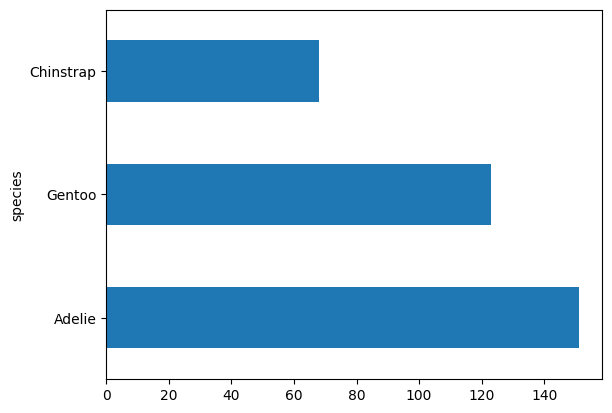

In [68]:
df['species'].value_counts().plot(kind='barh') #Number of entries in data for each species
plt.show()

In [69]:
print(df.dtypes)

species               object
island                object
bill_length_mm       float64
bill_depth_mm        float64
flipper_length_mm    float64
body_mass_g          float64
sex                   object
dtype: object


In [70]:
# Convert 'species', 'island', and 'sex' to categorical
df['species'] = df['species'].astype('category')
df['island'] = df['island'].astype('category')
df['sex'] = df['sex'].astype('category')

In [71]:
# Check the data types after conversion
print(df.dtypes)

species              category
island               category
bill_length_mm        float64
bill_depth_mm         float64
flipper_length_mm     float64
body_mass_g           float64
sex                  category
dtype: object


In [72]:
df

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,female
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,female
5,Adelie,Torgersen,39.3,20.6,190.0,3650.0,male
...,...,...,...,...,...,...,...
339,Chinstrap,Dream,55.8,19.8,207.0,4000.0,male
340,Chinstrap,Dream,43.5,18.1,202.0,3400.0,female
341,Chinstrap,Dream,49.6,18.2,193.0,3775.0,male
342,Chinstrap,Dream,50.8,19.0,210.0,4100.0,male


In [73]:
from sklearn.preprocessing import LabelEncoder

# Assuming 'df' is your DataFrame
le = LabelEncoder()
df['species_encoded'] = le.fit_transform(df['species'])
df['island_encoded'] = le.fit_transform(df['island'])
# df['sex'] = le.fit_transform(df['sex'])

In [74]:
df

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,species_encoded,island_encoded
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,male,0,2
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,female,0,2
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,female,0,2
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,female,0,2
5,Adelie,Torgersen,39.3,20.6,190.0,3650.0,male,0,2
...,...,...,...,...,...,...,...,...,...
339,Chinstrap,Dream,55.8,19.8,207.0,4000.0,male,1,1
340,Chinstrap,Dream,43.5,18.1,202.0,3400.0,female,1,1
341,Chinstrap,Dream,49.6,18.2,193.0,3775.0,male,1,1
342,Chinstrap,Dream,50.8,19.0,210.0,4100.0,male,1,1


In [75]:
df['sex'] = df['sex'].map({'male': 0, 'female': 1})


In [76]:
df = df.drop(columns=['species', 'island'])

In [77]:
df

,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,species_encoded,island_encoded
0,39.1,18.7,181.0,3750.0,0,0,2
1,39.5,17.4,186.0,3800.0,1,0,2
2,40.3,18.0,195.0,3250.0,1,0,2
4,36.7,19.3,193.0,3450.0,1,0,2
5,39.3,20.6,190.0,3650.0,0,0,2
...,...,...,...,...,...,...,...
339,55.8,19.8,207.0,4000.0,0,1,1
340,43.5,18.1,202.0,3400.0,1,1,1
341,49.6,18.2,193.0,3775.0,0,1,1
342,50.8,19.0,210.0,4100.0,0,1,1


In [78]:
# Get the 'sex' column
sex_column = df.pop('sex')

# Add it to the end
# penguins_standardized['sex'] = sex_column

In [79]:
df['sex'] = sex_column

In [80]:
df

,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,species_encoded,island_encoded,sex
0,39.1,18.7,181.0,3750.0,0,2,0
1,39.5,17.4,186.0,3800.0,0,2,1
2,40.3,18.0,195.0,3250.0,0,2,1
4,36.7,19.3,193.0,3450.0,0,2,1
5,39.3,20.6,190.0,3650.0,0,2,0
...,...,...,...,...,...,...,...
339,55.8,19.8,207.0,4000.0,1,1,0
340,43.5,18.1,202.0,3400.0,1,1,1
341,49.6,18.2,193.0,3775.0,1,1,0
342,50.8,19.0,210.0,4100.0,1,1,0


In [81]:
null_counts = df.isnull().sum()


In [82]:
print(null_counts)


bill_length_mm       0
bill_depth_mm        0
flipper_length_mm    0
body_mass_g          0
species_encoded      0
island_encoded       0
sex                  0
dtype: int64


## Model Building

In [83]:
class LogitRegression:
    def __init__(self, learning_rate, iterations):
        self.learning_rate = learning_rate
        self.iterations = iterations
        self.best_accuracy = 0
        self.accuracies = []
        self.loss_stack=[]
    def cost(self, y, y_pred):
        return -np.mean(y * np.log(y_pred) + (1 - y) * np.log(1 - y_pred))
    def sigmoid(self, z):
        return 1 / (1 + np.exp(-z))
    def gradient_descent(self,X,y,y_pred):
        dw=(1/len(y))*np.dot(X.T, (y_pred - y))
        db=(1/len(y))*np.sum(y_pred-y)
        return dw,db
    def fit(self, X, y):
        self.w = np.random.uniform(0, 1, X.shape[1])
        self.b = np.random.uniform(0, 1)
        self.loss = []
        
        for _ in range(self.iterations):
            z = np.dot(X, self.w) + self.b
            y_pred = self.sigmoid(z)

            dw, db = self.gradient_descent(X, y, y_pred)
            self.w -= self.learning_rate * dw
            self.b -= self.learning_rate * db
            current_loss = self.cost(y, y_pred)
            self.loss.append(current_loss)
            print(f'Iteration: {_}, Loss: {current_loss}')

            y_pred = (y_pred >= 0.5).astype(int)
            accuracy = np.mean(y_pred == y)
            self.accuracies.append(accuracy)
            if(accuracy > self.best_accuracy):
                self.best_accuracy = accuracy
                self.best_w = self.w

    def predict(self, X):
        z = np.dot(X, self.w) + self.b
        y_pred = self.sigmoid(z)
        return (y_pred >= 0.5).astype(int)
    
    def accuracy(self, Y_pred, Y):
        accuracy = np.mean(Y_pred == Y)
        return accuracy
    
    def plot(self):
        plt.plot(self.loss)
        plt.xlabel('Iteration')
        plt.ylabel('Loss')
        plt.show()

        plt.plot(self.accuracies)
        plt.xlabel('Iteration')
        plt.ylabel('Accuracy')
        plt.show()

In [84]:
features_to_standardize = df.iloc[:, :-1].values

In [85]:
features_to_standardize

array([[3.910e+01, 1.870e+01, 1.810e+02, 3.750e+03, 0.000e+00, 2.000e+00],
       [3.950e+01, 1.740e+01, 1.860e+02, 3.800e+03, 0.000e+00, 2.000e+00],
       [4.030e+01, 1.800e+01, 1.950e+02, 3.250e+03, 0.000e+00, 2.000e+00],
       ...,
       [4.960e+01, 1.820e+01, 1.930e+02, 3.775e+03, 1.000e+00, 1.000e+00],
       [5.080e+01, 1.900e+01, 2.100e+02, 4.100e+03, 1.000e+00, 1.000e+00],
       [5.020e+01, 1.870e+01, 1.980e+02, 3.775e+03, 1.000e+00, 1.000e+00]])

In [86]:
target_variable = df.iloc[:, -1].values

In [87]:
target_variable

[0, 1, 1, 1, 0, ..., 0, 1, 0, 0, 1]
Length: 342
Categories (2, int64): [1, 0]

In [88]:
# Calculate the mean and standard deviation for each feature
mean = np.mean(features_to_standardize, axis=0)
std_dev = np.std(features_to_standardize, axis=0)

In [89]:
# Standardize the features
features_standardized = (features_to_standardize - mean) / std_dev

In [90]:
# Combine the standardized features with the original target variable
df.iloc[:, :-1] = features_standardized
df.iloc[:, -1] = target_variable  # Restore the original target variable

In [91]:
df

,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,species_encoded,island_encoded,sex
0,-0.884499,0.785449,-1.418347,-0.564142,-1.030068,1.852870,0
1,-0.811126,0.126188,-1.062250,-0.501703,-1.030068,1.852870,1
2,-0.664380,0.430462,-0.421277,-1.188532,-1.030068,1.852870,1
4,-1.324737,1.089724,-0.563715,-0.938776,-1.030068,1.852870,1
5,-0.847812,1.748985,-0.777373,-0.689020,-1.030068,1.852870,0
...,...,...,...,...,...,...,...
339,2.178824,1.343286,0.433355,-0.251947,0.091853,0.469286,0
340,-0.077396,0.481175,0.077258,-1.001215,0.091853,0.469286,1
341,1.041543,0.531887,-0.563715,-0.532923,0.091853,0.469286,0
342,1.261662,0.937586,0.647013,-0.127069,0.091853,0.469286,0


In [92]:
split_ratio = 0.8
split_index = int(split_ratio * len(df))
train_data = df[:split_index]
test_data = df[split_index:]

In [93]:
train_data

,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,species_encoded,island_encoded,sex
0,-0.884499,0.785449,-1.418347,-0.564142,-1.030068,1.852870,0
1,-0.811126,0.126188,-1.062250,-0.501703,-1.030068,1.852870,1
2,-0.664380,0.430462,-0.421277,-1.188532,-1.030068,1.852870,1
4,-1.324737,1.089724,-0.563715,-0.938776,-1.030068,1.852870,1
5,-0.847812,1.748985,-0.777373,-0.689020,-1.030068,1.852870,0
...,...,...,...,...,...,...,...
269,0.894797,-0.482361,1.501644,2.245614,1.213774,-0.914298,0
270,0.601305,-1.750171,0.931890,0.903175,1.213774,-0.914298,1
272,0.527932,-1.445897,1.003109,0.809516,1.213774,-0.914298,1
273,1.188289,-0.735923,1.501644,1.933419,1.213774,-0.914298,0


In [94]:
test_data

,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,species_encoded,island_encoded,sex
275,1.096572,-0.533073,0.860670,1.496346,1.213774,-0.914298,0
276,0.472902,0.379750,-0.634935,-0.876337,0.091853,0.469286,1
277,1.114916,1.191149,-0.350057,-0.376825,0.091853,0.469286,0
278,1.353378,1.039011,-0.563715,-0.689020,0.091853,0.469286,0
279,0.271126,0.785449,-0.919812,-0.845118,0.091853,0.469286,1
...,...,...,...,...,...,...,...
339,2.178824,1.343286,0.433355,-0.251947,0.091853,0.469286,0
340,-0.077396,0.481175,0.077258,-1.001215,0.091853,0.469286,1
341,1.041543,0.531887,-0.563715,-0.532923,0.091853,0.469286,0
342,1.261662,0.937586,0.647013,-0.127069,0.091853,0.469286,0


In [95]:
# Extract features and labels
X_train = train_data.drop('sex', axis=1).values
Y_train = train_data['sex'].values

X_test = test_data.drop('sex', axis=1).values
Y_test = test_data['sex'].values

In [96]:
print("X_train:")
print(X_train)

print("\ny_train:")
print(Y_train)

print("\nX_test:")
print(X_test)

print("\ny_test:")
print(Y_test)

print("\nShapes:")
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {Y_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {Y_test.shape}")

X_train:
[[-0.88449874  0.78544923 -1.41834665 -0.56414208 -1.03006754  1.85286967]
 [-0.81112573  0.1261879  -1.06225022 -0.50170305 -1.03006754  1.85286967]
 [-0.66437972  0.43046236 -0.42127665 -1.18853234 -1.03006754  1.85286967]
 ...
 [ 0.52793167 -1.44589681  1.00310906  0.8095165   1.21377385 -0.91429814]
 [ 1.18828874 -0.73592307  1.50164406  1.93341896  1.21377385 -0.91429814]
 [ 0.23443963 -1.19233476  0.7894512   1.24658968  1.21377385 -0.91429814]]

y_train:
[0, 1, 1, 1, 0, ..., 0, 1, 1, 0, 1]
Length: 273
Categories (2, int64): [1, 0]

X_test:
[[ 1.09657248 -0.53307343  0.86067049  1.49634578  1.21377385 -0.91429814]
 [ 0.47290191  0.37974995 -0.63493451 -0.87633721  0.09185316  0.46928577]
 [ 1.11491573  1.19114851 -0.35005737 -0.376825    0.09185316  0.46928577]
 [ 1.35337801  1.03901128 -0.56371522 -0.68902013  0.09185316  0.46928577]
 [ 0.27112614  0.78544923 -0.91981165 -0.84511769  0.09185316  0.46928577]
 [ 1.61018354  1.34328574 -0.27883808 -0.59536159  0.09185316  

In [97]:
Y_train=train_data['sex'].cat.codes.astype(int)
Y_test=test_data['sex'].cat.codes.astype(int)

In [98]:
b=[]
def model(learning_rate, iterations):
    model = LogitRegression(learning_rate, iterations)
    model.fit(X_train, Y_train)
    Y_pred_train = model.predict(X_train)
    Y_pred_test = model.predict(X_test)

    train_accuracy = model.accuracy(Y_pred_train, Y_train)
    test_accuracy = model.accuracy(Y_pred_test,  Y_test)
    b.append(train_accuracy)

    print(f"Train Accuracy: {train_accuracy}")
    print(f"Test Accuracy: {test_accuracy}")
    print(model.best_accuracy)
    print(model.best_w)
    model.plot()

Iteration: 0, Loss: 0.5617073908574204
Iteration: 1, Loss: 0.5607854829143678
Iteration: 2, Loss: 0.5598724103677657
Iteration: 3, Loss: 0.5589680602259373
Iteration: 4, Loss: 0.5580723207520478
Iteration: 5, Loss: 0.5571850814583402
Iteration: 6, Loss: 0.5563062331001539
Iteration: 7, Loss: 0.5554356676697398
Iteration: 8, Loss: 0.554573278389876
Iteration: 9, Loss: 0.5537189597072903
Iteration: 10, Loss: 0.5528726072858987
Iteration: 11, Loss: 0.5520341179998667
Iteration: 12, Loss: 0.5512033899264992
Iteration: 13, Loss: 0.5503803223389667
Iteration: 14, Loss: 0.5495648156988754
Iteration: 15, Loss: 0.5487567716486845
Iteration: 16, Loss: 0.5479560930039836
Iteration: 17, Loss: 0.5471626837456296
Iteration: 18, Loss: 0.5463764490117541
Iteration: 19, Loss: 0.5455972950896464
Iteration: 20, Loss: 0.5448251294075184
Iteration: 21, Loss: 0.5440598605261568
Iteration: 22, Loss: 0.5433013981304694
Iteration: 23, Loss: 0.5425496530209315
Iteration: 24, Loss: 0.5418045371049366
Iteration: 

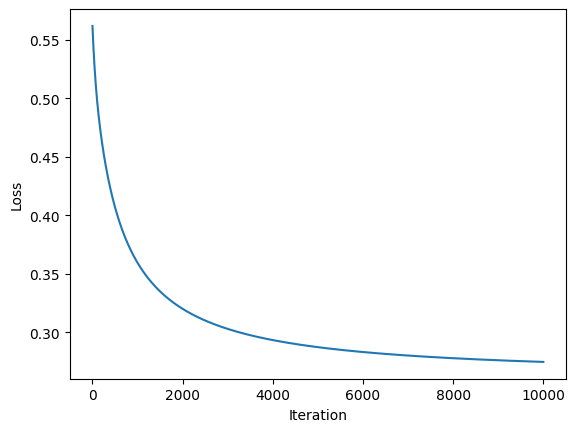

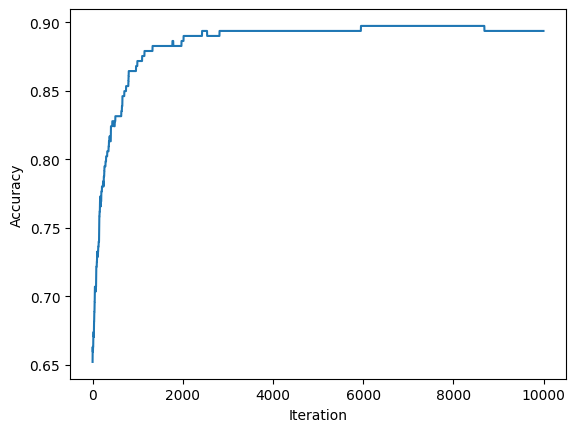

In [99]:
model(learning_rate=0.01, iterations=10000)

Iteration: 0, Loss: 0.6610331185106918
Iteration: 1, Loss: 0.6609406131545025
Iteration: 2, Loss: 0.6608481486367237
Iteration: 3, Loss: 0.6607557249283901
Iteration: 4, Loss: 0.6606633420005602
Iteration: 5, Loss: 0.6605709998243183
Iteration: 6, Loss: 0.660478698370773
Iteration: 7, Loss: 0.6603864376110579
Iteration: 8, Loss: 0.6602942175163312
Iteration: 9, Loss: 0.6602020380577764
Iteration: 10, Loss: 0.6601098992066017
Iteration: 11, Loss: 0.6600178009340396
Iteration: 12, Loss: 0.6599257432113479
Iteration: 13, Loss: 0.6598337260098089
Iteration: 14, Loss: 0.6597417493007298
Iteration: 15, Loss: 0.6596498130554423
Iteration: 16, Loss: 0.6595579172453035
Iteration: 17, Loss: 0.659466061841694
Iteration: 18, Loss: 0.6593742468160205
Iteration: 19, Loss: 0.6592824721397134
Iteration: 20, Loss: 0.6591907377842282
Iteration: 21, Loss: 0.6590990437210451
Iteration: 22, Loss: 0.6590073899216687
Iteration: 23, Loss: 0.6589157763576285
Iteration: 24, Loss: 0.6588242030004787
Iteration: 2

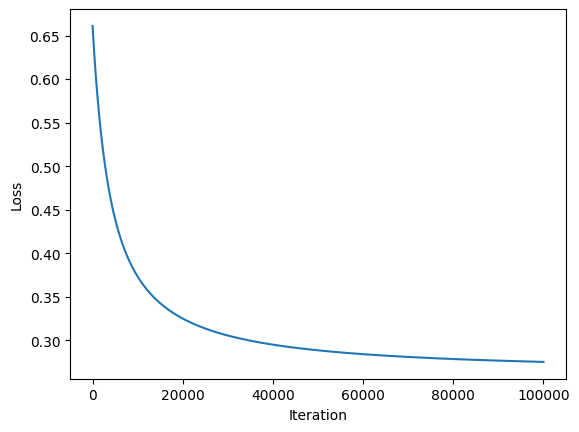

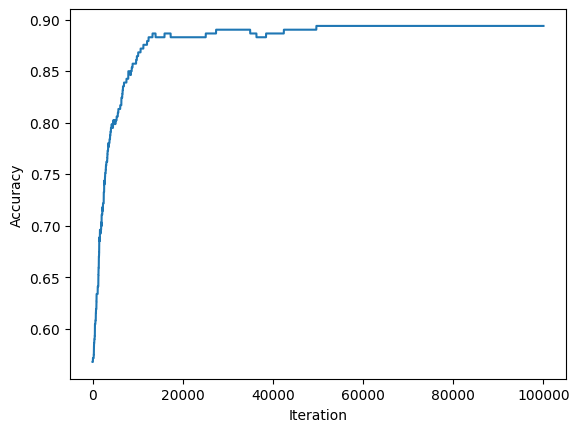

In [100]:
model(learning_rate=0.001, iterations=100000)

Iteration: 0, Loss: 0.6097557594539094
Iteration: 1, Loss: 0.6094814897846118
Iteration: 2, Loss: 0.6092075476884542
Iteration: 3, Loss: 0.6089339328988439
Iteration: 4, Loss: 0.6086606451490463
Iteration: 5, Loss: 0.6083876841721858
Iteration: 6, Loss: 0.608115049701247
Iteration: 7, Loss: 0.6078427414690751
Iteration: 8, Loss: 0.607570759208378
Iteration: 9, Loss: 0.6072991026517258
Iteration: 10, Loss: 0.6070277715315536
Iteration: 11, Loss: 0.6067567655801607
Iteration: 12, Loss: 0.6064860845297129
Iteration: 13, Loss: 0.6062157281122427
Iteration: 14, Loss: 0.6059456960596508
Iteration: 15, Loss: 0.6056759881037068
Iteration: 16, Loss: 0.6054066039760504
Iteration: 17, Loss: 0.6051375434081921
Iteration: 18, Loss: 0.6048688061315145
Iteration: 19, Loss: 0.6046003918772729
Iteration: 20, Loss: 0.6043323003765967
Iteration: 21, Loss: 0.6040645313604901
Iteration: 22, Loss: 0.6037970845598336
Iteration: 23, Loss: 0.6035299597053838
Iteration: 24, Loss: 0.6032631565277757
Iteration: 2

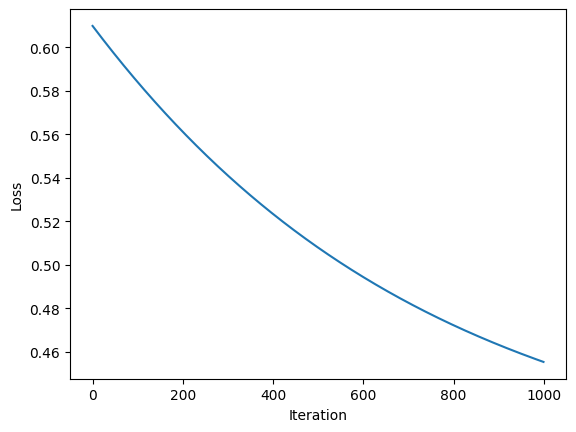

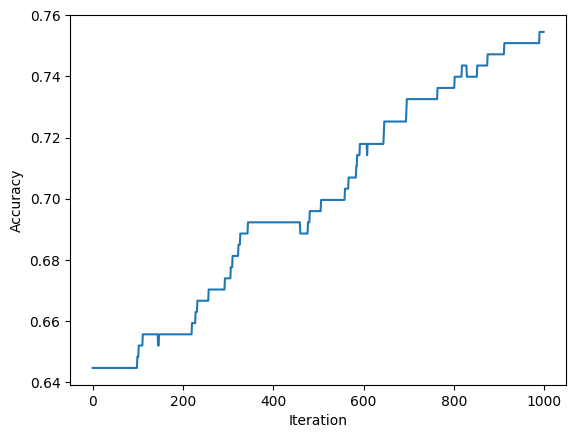

In [101]:
model(learning_rate=0.001, iterations=1000)

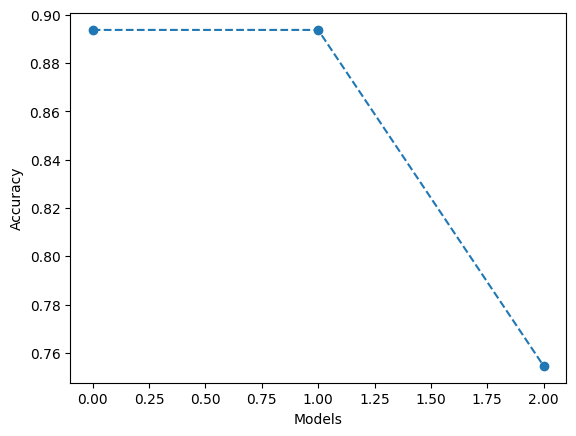

In [102]:
plt.plot(b, 'o--')  
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.show()